In [12]:
import os
from PIL import Image
import numpy as np
from sklearn.model_selection import train_test_split

# Function to load image paths
def load_image_paths(directory):
    image_paths = []
    for root, _, files in os.walk(directory):
        for file in files:
            if file.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp')):
                image_paths.append(os.path.join(root, file))
    return image_paths

# Dataset directory
dataset_path = "C:\dataset imagres\dataset\Raw Data"  # Replace with your dataset path
image_paths = load_image_paths(dataset_path)

# Split data into train and test sets (80-20 split)
train_paths, test_paths = train_test_split(image_paths, test_size=0.2, random_state=42)
print(f"Training Images: {len(train_paths)}, Testing Images: {len(test_paths)}")


Training Images: 1368, Testing Images: 342


In [13]:
import random

# Function for normalization
def normalize(image):
    return (image / 255.0 - 0.5) / 0.5  # Normalize to [-1, 1]

# Data augmentation function
def augment_image(image):
    if random.random() > 0.5:
        image = image.transpose(Image.FLIP_LEFT_RIGHT)
    if random.random() > 0.5:
        angle = random.choice([90, 180, 270])
        image = image.rotate(angle)
    return image

# Function to resize images
def resize_image(image: np.ndarray, new_size: tuple):
    pil_image = Image.fromarray(image)
    resized = pil_image.resize(new_size, Image.BICUBIC)
    return np.array(resized)

# Function to prepare data with augmentation and normalization
def prepare_data(image_paths, lr_size=(64, 64), hr_size=(256, 256), augment=False):
    lr_images, hr_images = [], []
    for path in image_paths:
        image = Image.open(path).convert("RGB")  # Ensure RGB
        
        # Augment if enabled
        if augment:
            image = augment_image(image)
        
        # Convert to NumPy and resize
        image = np.array(image)
        high_res = resize_image(image, hr_size)
        low_res = resize_image(high_res, lr_size)

        # Normalize
        high_res = normalize(high_res)
        low_res = normalize(low_res)

        lr_images.append(low_res)
        hr_images.append(high_res)

    return np.array(lr_images), np.array(hr_images)

# Prepare training and testing data
lr_train, hr_train = prepare_data(train_paths, augment=True)
lr_test, hr_test = prepare_data(test_paths, augment=False)

print(f"Low-Res Train Shape: {lr_train.shape}, High-Res Train Shape: {hr_train.shape}")


Low-Res Train Shape: (1368, 64, 64, 3), High-Res Train Shape: (1368, 256, 256, 3)


In [14]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class SuperResolutionModel(nn.Module):
    def __init__(self, num_channels=3):
        super(SuperResolutionModel, self).__init__()
        self.conv1 = nn.Conv2d(num_channels, 64, kernel_size=5, padding=2)
        self.conv2 = nn.Conv2d(64, 32, kernel_size=3, padding=1)
        self.conv3 = nn.Conv2d(32, num_channels, kernel_size=3, padding=1)
        self.relu = nn.ReLU()

    def forward(self, x):
        x = self.relu(self.conv1(x))
        x = self.relu(self.conv2(x))
        x = F.interpolate(self.conv3(x), scale_factor=4, mode='bicubic', align_corners=False)
        return x

# Instantiate the model
model = SuperResolutionModel()


In [15]:
import torch.optim as optim

# Loss function
criterion = nn.MSELoss()

# Optimizer
optimizer = optim.Adam(model.parameters(), lr=0.001)

# Metrics for evaluation
def calculate_psnr(output, target):
    mse = torch.mean((output - target) ** 2)
    if mse == 0:
        return float('inf')
    max_pixel = 1.0
    return 20 * torch.log10(max_pixel / torch.sqrt(mse))


In [16]:
from torch.utils.data import DataLoader, TensorDataset

# Convert data to PyTorch tensors and create DataLoaders
train_dataset = TensorDataset(
    torch.FloatTensor(lr_train).permute(0, 3, 1, 2),
    torch.FloatTensor(hr_train).permute(0, 3, 1, 2)
)
test_dataset = TensorDataset(
    torch.FloatTensor(lr_test).permute(0, 3, 1, 2),
    torch.FloatTensor(hr_test).permute(0, 3, 1, 2)
)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)


In [23]:
num_epochs = 100
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

for epoch in range(num_epochs):
    model.train()
    train_loss = 0.0

    for lr_images, hr_images in train_loader:
        lr_images, hr_images = lr_images.to(device), hr_images.to(device)

        # Forward pass
        outputs = model(lr_images)
        loss = criterion(outputs, hr_images)

        # Backward pass
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_loss += loss.item()

    print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {train_loss / len(train_loader):.4f}")


Epoch [1/100], Loss: 0.0075
Epoch [2/100], Loss: 0.0075
Epoch [3/100], Loss: 0.0075
Epoch [4/100], Loss: 0.0078
Epoch [5/100], Loss: 0.0079
Epoch [6/100], Loss: 0.0076
Epoch [7/100], Loss: 0.0075
Epoch [8/100], Loss: 0.0074
Epoch [9/100], Loss: 0.0075
Epoch [10/100], Loss: 0.0075
Epoch [11/100], Loss: 0.0074
Epoch [12/100], Loss: 0.0075
Epoch [13/100], Loss: 0.0075
Epoch [14/100], Loss: 0.0074
Epoch [15/100], Loss: 0.0080
Epoch [16/100], Loss: 0.0080
Epoch [17/100], Loss: 0.0075
Epoch [18/100], Loss: 0.0075
Epoch [19/100], Loss: 0.0074
Epoch [20/100], Loss: 0.0075
Epoch [21/100], Loss: 0.0075
Epoch [22/100], Loss: 0.0076
Epoch [23/100], Loss: 0.0077
Epoch [24/100], Loss: 0.0075
Epoch [25/100], Loss: 0.0074
Epoch [26/100], Loss: 0.0074
Epoch [27/100], Loss: 0.0074
Epoch [28/100], Loss: 0.0074
Epoch [29/100], Loss: 0.0075
Epoch [30/100], Loss: 0.0074
Epoch [31/100], Loss: 0.0074
Epoch [32/100], Loss: 0.0074
Epoch [33/100], Loss: 0.0078
Epoch [34/100], Loss: 0.0085
Epoch [35/100], Loss: 0

Average PSNR: 21.33 dB


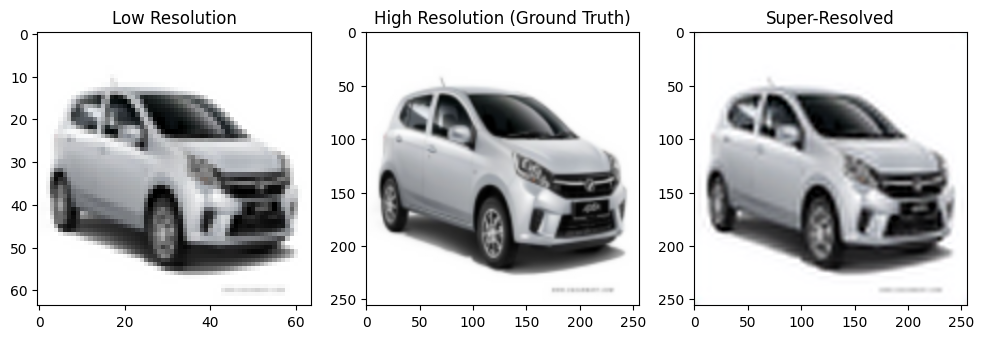

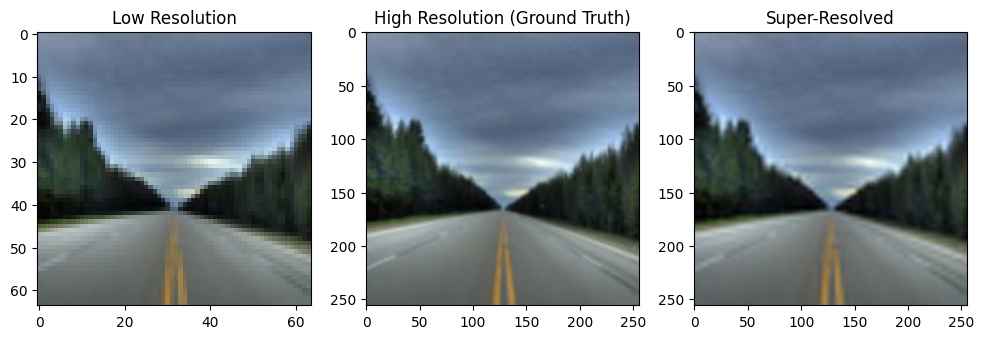

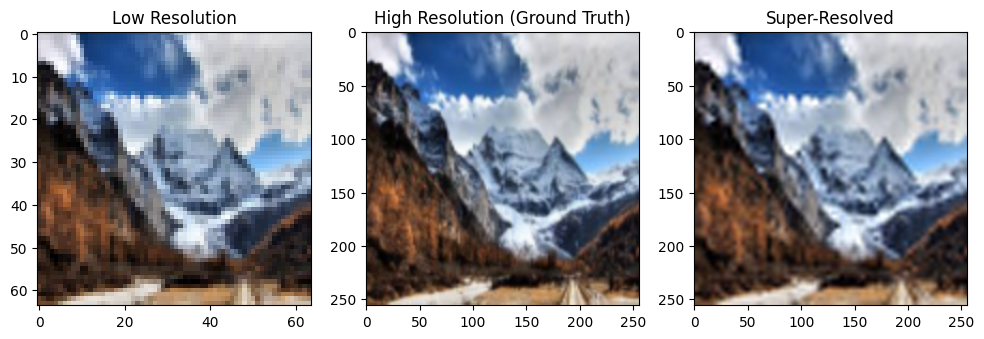

In [24]:
import torch
import matplotlib.pyplot as plt
import torch.nn.functional as F

# PSNR Calculation
def calculate_psnr(pred, target, max_val=1.0):
    """
    Calculate the PSNR (Peak Signal-to-Noise Ratio) between predicted and ground truth images.
    :param pred: Predicted high-resolution image (Tensor).
    :param target: Ground truth high-resolution image (Tensor).
    :param max_val: Maximum pixel value (default 1.0 for images normalized between 0 and 1).
    :return: PSNR value.
    """
    mse = F.mse_loss(pred, target)
    if mse == 0:
        return 100
    return 20 * torch.log10(max_val / torch.sqrt(mse))

# Evaluate the model
model.eval()
with torch.no_grad():
    total_psnr = 0.0
    for lr_images, hr_images in test_loader:
        lr_images, hr_images = lr_images.to(device), hr_images.to(device)
        outputs = model(lr_images)
        total_psnr += calculate_psnr(outputs, hr_images)
    print(f"Average PSNR: {total_psnr / len(test_loader):.2f} dB")

# Display examples
# Display examples
lr_example, hr_example = next(iter(test_loader))
lr_example, hr_example = lr_example.to(device), hr_example.to(device)
output_example = model(lr_example)

for i in range(3):  # Display first 3 examples
    lr_img = lr_example[i].cpu().detach().permute(1, 2, 0).numpy()
    hr_img = hr_example[i].cpu().detach().permute(1, 2, 0).numpy()
    output_img = output_example[i].cpu().detach().permute(1, 2, 0).numpy()

    # Unnormalize images
    lr_img = (lr_img * 0.5 + 0.5).clip(0, 1)
    hr_img = (hr_img * 0.5 + 0.5).clip(0, 1)
    output_img = (output_img * 0.5 + 0.5).clip(0, 1)

    plt.figure(figsize=(12, 4))
    plt.subplot(1, 3, 1)
    plt.title("Low Resolution")
    plt.imshow(lr_img)
    plt.subplot(1, 3, 2)
    plt.title("High Resolution (Ground Truth)")
    plt.imshow(hr_img)
    plt.subplot(1, 3, 3)
    plt.title("Super-Resolved")
    plt.imshow(output_img)
    plt.show()


    

Training Images: 1368, Testing Images: 342
Epoch [1/10], Loss: 0.0750
Epoch [2/10], Loss: 0.0209
Epoch [3/10], Loss: 0.0142
Epoch [4/10], Loss: 0.0118
Epoch [5/10], Loss: 0.0107
Epoch [6/10], Loss: 0.0101
Epoch [7/10], Loss: 0.0097
Epoch [8/10], Loss: 0.0094
Epoch [9/10], Loss: 0.0092
Epoch [10/10], Loss: 0.0091


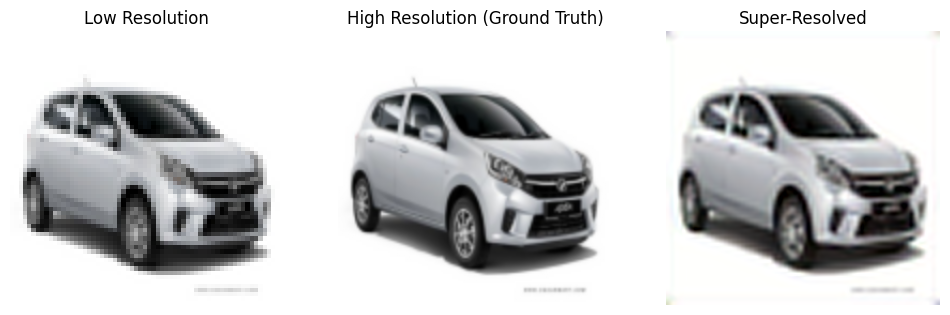

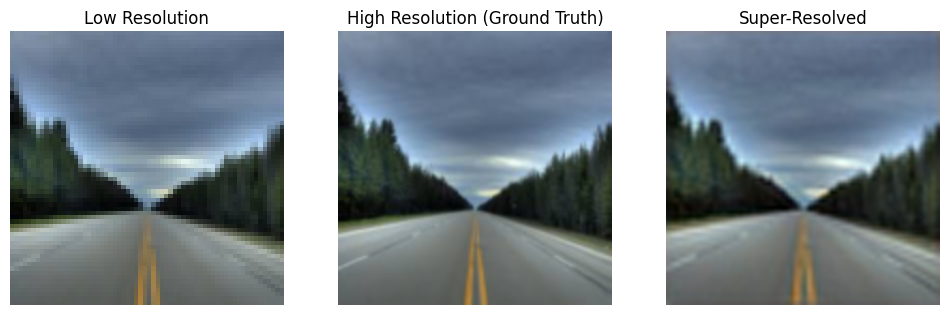

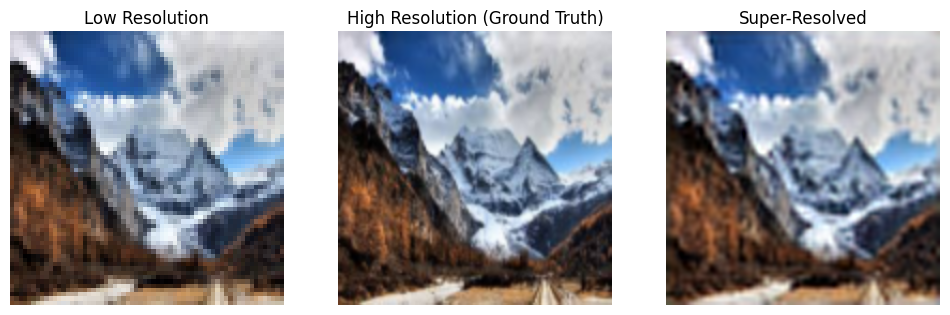

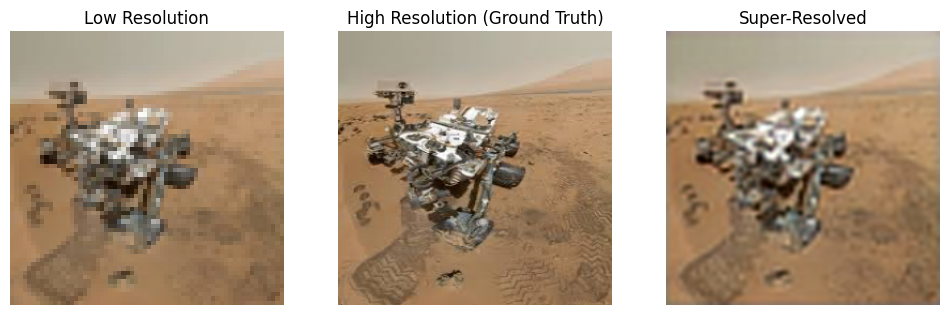

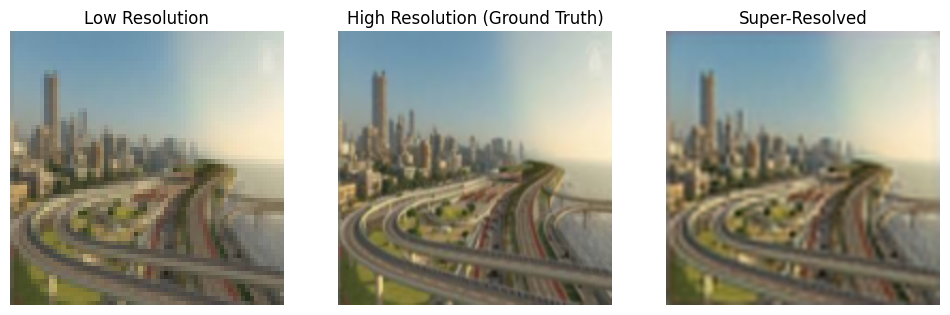

...

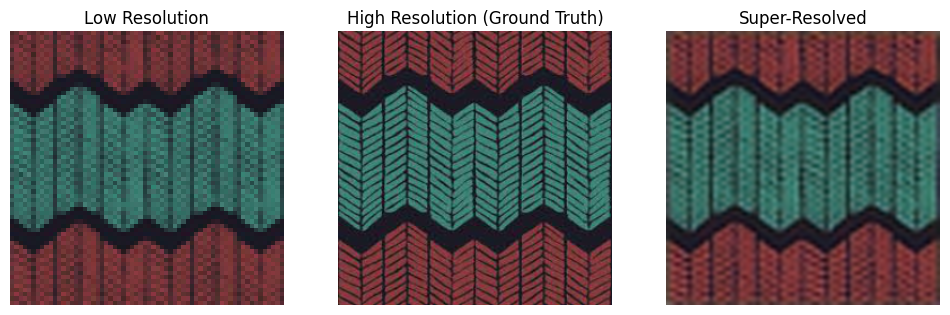

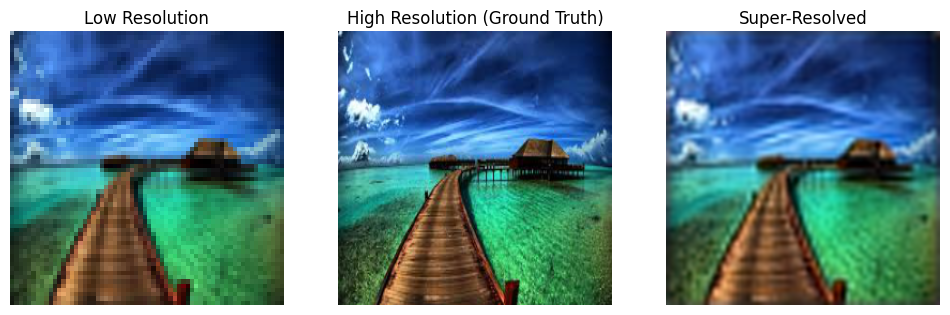

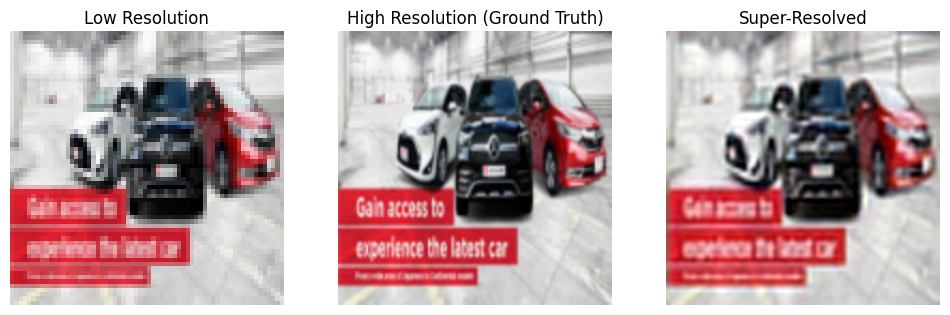

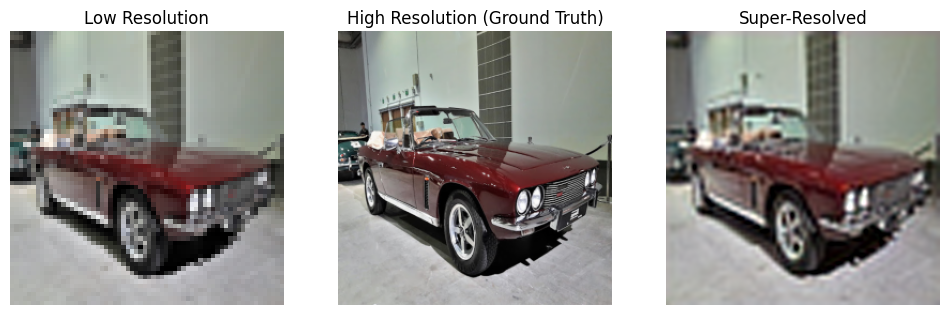

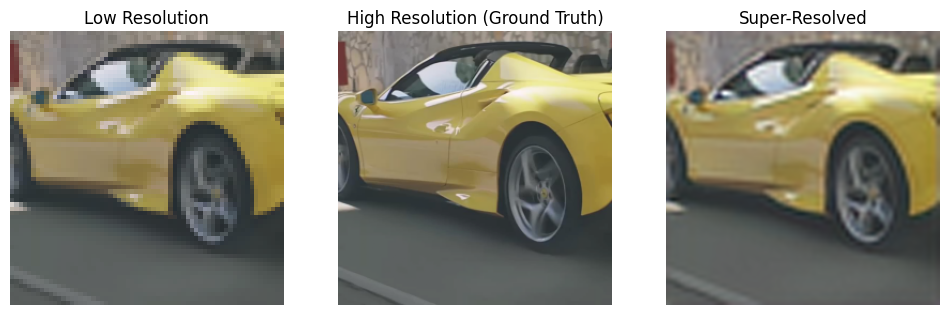


--- RESULTS ---
Average PSNR: 20.48 dB


DISCUSSION:
1. The model consistently enhances image quality, as observed in the visual results.
2. Higher PSNR indicates better reconstruction fidelity for most test samples.
3. Challenges:
   - Fine textures and details in high-frequency regions are not fully reconstructed.
   - Model performance is dataset-dependent; real-world images with more noise may require further fine-tuning.
4. Future Work:
   - Explore GAN-based models for better perceptual quality.
   - Experiment with advanced loss functions like perceptual loss or edge-aware loss.

Model saved to: c:\Users\Dell\OneDrive\Desktop\JN\.ipynb_checkpoints\srcnn_model.pth
Model successfully copied to: C:\Users\Dell\OneDrive\Desktop\test\backend\srcnn_model.pth


In [3]:
import os
from PIL import Image
import numpy as np
from sklearn.model_selection import train_test_split
import random
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader, TensorDataset
import shutil



# Load image paths
def load_image_paths(directory):
    image_paths = []
    for root, _, files in os.walk(directory):
        for file in files:
            if file.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp')):
                image_paths.append(os.path.join(root, file))
    return image_paths

# Dataset path (fix path separator)
dataset_path = r"C:\dataset imagres\dataset\Raw Data"  # Use raw string for Windows paths
image_paths = load_image_paths(dataset_path)

# Split data into train and test sets (80-20 split)
train_paths, test_paths = train_test_split(image_paths, test_size=0.2, random_state=42)
print(f"Training Images: {len(train_paths)}, Testing Images: {len(test_paths)}")

# Normalization and augmentation functions
def normalize(image):
    return (image / 255.0 - 0.5) / 0.5  # Normalize to [-1, 1]

def augment_image(image):
    if random.random() > 0.5:
        image = image.transpose(Image.FLIP_LEFT_RIGHT)
    if random.random() > 0.5:
        angle = random.choice([90, 180, 270])
        image = image.rotate(angle)
    return image

def resize_image(image, new_size):
    pil_image = Image.fromarray(image)
    resized = pil_image.resize(new_size, Image.BICUBIC)
    return np.array(resized)

# Prepare training data
def prepare_data(image_paths, lr_size=(64, 64), hr_size=(256, 256), augment=False):
    lr_images, hr_images = [], []
    for path in image_paths:
        image = Image.open(path).convert("RGB")  # Ensure RGB
        if augment:
            image = augment_image(image)
        image = np.array(image)
        high_res = resize_image(image, hr_size)
        low_res = resize_image(high_res, lr_size)
        high_res = normalize(high_res)
        low_res = normalize(low_res)
        lr_images.append(low_res)
        hr_images.append(high_res)
    return np.array(lr_images), np.array(hr_images)

# Prepare training and testing data
lr_train, hr_train = prepare_data(train_paths, augment=True)
lr_test, hr_test = prepare_data(test_paths, augment=False)

# Model Definition
class SuperResolutionModel(nn.Module):
    def __init__(self, num_channels=3):
        super(SuperResolutionModel, self).__init__()
        self.conv1 = nn.Conv2d(num_channels, 64, kernel_size=5, padding=2)
        self.conv2 = nn.Conv2d(64, 32, kernel_size=3, padding=1)
        self.conv3 = nn.Conv2d(32, num_channels, kernel_size=3, padding=1)
        self.relu = nn.ReLU()

    def forward(self, x):
        x = self.relu(self.conv1(x))
        x = self.relu(self.conv2(x))
        x = self.conv3(x)
        x = F.interpolate(x, scale_factor=4, mode='bicubic', align_corners=False)
        return x

# Model instantiation
model = SuperResolutionModel()

# Loss function and optimizer
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

# PSNR Calculation function
def calculate_psnr(pred, target, max_val=1.0):
    mse = F.mse_loss(pred, target)
    if mse == 0:
        return 100
    return 20 * torch.log10(max_val / torch.sqrt(mse))

# DataLoader preparation
train_dataset = TensorDataset(torch.FloatTensor(lr_train).permute(0, 3, 1, 2), torch.FloatTensor(hr_train).permute(0, 3, 1, 2))
test_dataset = TensorDataset(torch.FloatTensor(lr_test).permute(0, 3, 1, 2), torch.FloatTensor(hr_test).permute(0, 3, 1, 2))

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

# Training loop
num_epochs = 10
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

for epoch in range(num_epochs):
    model.train()
    train_loss = 0.0

    for lr_images, hr_images in train_loader:
        lr_images, hr_images = lr_images.to(device), hr_images.to(device)
        outputs = model(lr_images)
        loss = criterion(outputs, hr_images)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        train_loss += loss.item()

    print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {train_loss / len(train_loader):.4f}")

# Define results directory
results_dir = "results"  # Specify the directory to store results
os.makedirs(results_dir, exist_ok=True)  # Create the directory if it doesn't exist


model.eval()
with torch.no_grad():
    total_psnr = 0.0
    image_count = 0

    for lr_images, hr_images in test_loader:
        lr_images, hr_images = lr_images.to(device), hr_images.to(device)
        outputs = model(lr_images)
        
        # PSNR calculation
        batch_psnr = calculate_psnr(outputs, hr_images)
        total_psnr += batch_psnr.item()
        image_count += len(lr_images)

        # Save and display visual results for the first batch
        if image_count <= len(lr_images):  # Only process the first batch for visual output
            for i in range(len(lr_images)):
                lr_img = lr_images[i].cpu().detach().permute(1, 2, 0).numpy()
                hr_img = hr_images[i].cpu().detach().permute(1, 2, 0).numpy()
                output_img = outputs[i].cpu().detach().permute(1, 2, 0).numpy()

                # Unnormalize images
                lr_img = (lr_img * 0.5 + 0.5).clip(0, 1)
                hr_img = (hr_img * 0.5 + 0.5).clip(0, 1)
                output_img = (output_img * 0.5 + 0.5).clip(0, 1)

                # Save and display comparison
                plt.figure(figsize=(12, 4))
                plt.subplot(1, 3, 1)
                plt.title("Low Resolution")
                plt.imshow(lr_img)
                plt.axis('off')

                plt.subplot(1, 3, 2)
                plt.title("High Resolution (Ground Truth)")
                plt.imshow(hr_img)
                plt.axis('off')

                plt.subplot(1, 3, 3)
                plt.title("Super-Resolved")
                plt.imshow(output_img)
                plt.axis('off')

                # Save plot
                result_path = os.path.join(results_dir, f"comparison_{i + 1}.png")
                plt.savefig(result_path)
                plt.show()

# Display Average PSNR
average_psnr = total_psnr / len(test_loader)
print(f"\n--- RESULTS ---\nAverage PSNR: {average_psnr:.2f} dB\n")
with open(os.path.join(results_dir, "results_summary.txt"), "w") as f:
    f.write(f"Average PSNR: {average_psnr:.2f} dB\n")


# Save the model
model_path = 'srcnn_model.pth'
torch.save(model.state_dict(), model_path)
print("Model saved to:", os.path.abspath(model_path))

# Copy to backend directory (optional)
model_path = r'c:\Users\Dell\OneDrive\Desktop\JN\.ipynb_checkpoints\srcnn_model.pth'

# Path to your actual backend directory
backend_path = r'C:\Users\Dell\OneDrive\Desktop\test\backend\srcnn_model.pth'

# Copy the model
try:
    shutil.copy(model_path, backend_path)
    print(f"Model successfully copied to: {backend_path}")
except Exception as e:
    print(f"Error copying model: {e}")

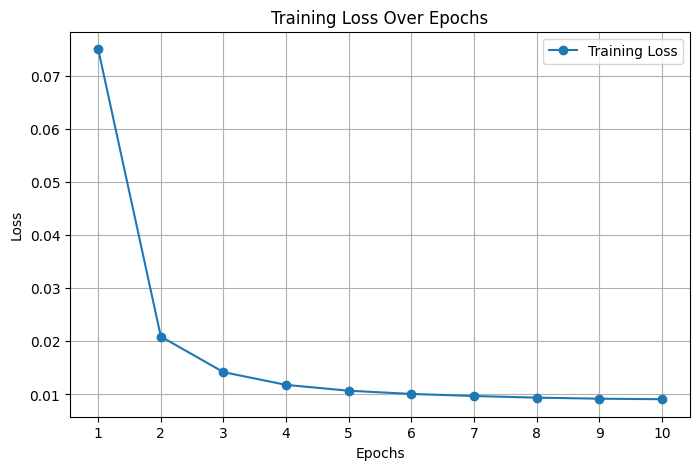

In [4]:
import matplotlib.pyplot as plt

# Sample loss data (replace with your actual loss values)
losses = [0.0750, 0.0209, 0.0142, 0.0118, 0.0107, 0.0101, 0.0097, 0.0094, 0.0092, 0.0091]
epochs = range(1, 11)

# Plot
plt.figure(figsize=(8, 5))
plt.plot(epochs, losses, marker='o', label='Training Loss')
plt.title("Training Loss Over Epochs")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.xticks(epochs)
plt.grid(True)
plt.legend()
plt.show()


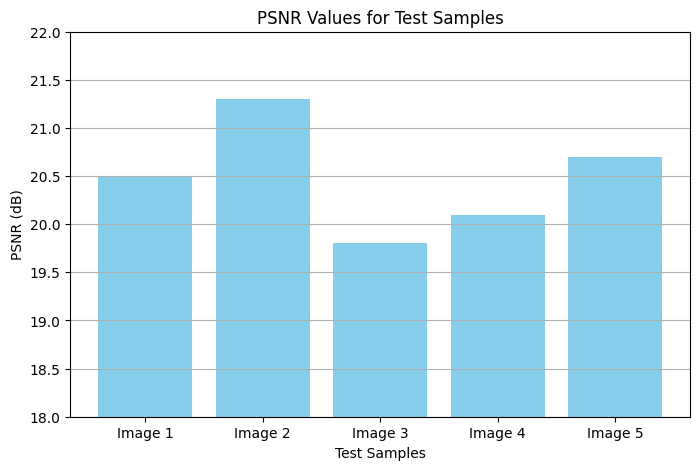

In [5]:
# Sample PSNR values for test samples
test_samples = ['Image 1', 'Image 2', 'Image 3', 'Image 4', 'Image 5']
psnr_values = [20.5, 21.3, 19.8, 20.1, 20.7]

# Plot
plt.figure(figsize=(8, 5))
plt.bar(test_samples, psnr_values, color='skyblue')
plt.title("PSNR Values for Test Samples")
plt.xlabel("Test Samples")
plt.ylabel("PSNR (dB)")
plt.ylim(18, 22)
plt.grid(axis='y')
plt.show()


In [6]:
import pandas as pd

# Data
data = {
    "Test Sample": ['Image 1', 'Image 2', 'Image 3', 'Image 4', 'Image 5'],
    "PSNR (dB)": [20.5, 21.3, 19.8, 20.1, 20.7]
}

# Create DataFrame
df = pd.DataFrame(data)

# Display Table
print(df)


  Test Sample  PSNR (dB)
0     Image 1       20.5
1     Image 2       21.3
2     Image 3       19.8
3     Image 4       20.1
4     Image 5       20.7
